In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import re

import os, sys, re, pickle, glob
import urllib.request
import zipfile
from pathlib import Path

import IPython.display as ipd
from tqdm import tqdm
import librosa

In [2]:
def automation_potter(string):
    take_num = re.search("(?<![0-9S])(\d)(?![0-9])",string)
    S_num = re.search("(S\d+)",string)
    w_or_h = None
    if 'whistle' in string or 'Whistle' in string:
        w_or_h = 'whistle'
    else:
        w_or_h = 'hum'
    return S_num.group()+'_'+w_or_h+'_'+take_num.group()+'_'+'StarWars.wav'

In [3]:
automation_potter('S42_Hum3_Potter.wav')
automation_potter('S55_harrypotter_whistle_1')
automation_potter('S8_hum_1_[Potter].wav')
automation_potter('S18_Whistle_2_StarWars')

'S18_whistle_2_StarWars.wav'

In [4]:
dataFolder = Path(r'C:\Users\ellio\Documents\MLHW\StarWars_1')
pot_names = os.listdir(dataFolder)
# for x in pot_names:
#     print(x)

In [28]:
for x in os.listdir(dataFolder):
    old_name = os.path.join(dataFolder, x)
    new_name = os.path.join(dataFolder, automation_potter(x))
    #print(new_name)
    #full_path = os.path.join(dataFolder, os.listdir(dataFolder)[i])
    #print(full_path)
    #print(automation_potter(os.listdir(dataFolder)[i]))
    #print(automation_potter(pot_names[i]))
    #new_name = full_path.replace(os.listdir(dataFolder)[i], automation_potter(os.listdir(dataFolder)[i]))
    #os.rename(old_name,new_name)

In [6]:
# for path in os.listdir(dataFolder):
#     print(path)

In [35]:
sample_path = '/Users/ellio/Documents/MLHW/STP/*.wav'
files = glob.glob(sample_path)
len(files)
#print(files)

420

In [36]:
MLENDHW_table = [] 

for file in files:
    file_name = file.split('\\')[-1]
    #print(file_name.split('_'))
    participant_ID = file_name.split('_')[0]
    interpretation_type = file_name.split('_')[1]
    interpretation_number = file_name.split('_')[2]
    #print(re.search("\w+?(?=\.wav)",file_name.split('_')[3]).group())
    song = re.search("\w+?(?=\.wav)",file_name.split('_')[3]).group()
    MLENDHW_table.append([file_name,participant_ID,interpretation_type,interpretation_number, song])

In [37]:
MLENDHW_df = pd.DataFrame(MLENDHW_table,columns=['file_id','participant','interpretation','number','song']).set_index('file_id') 
MLENDHW_df

,participant,interpretation,number,song
file_id,,,,
S100_hum_1_Potter.wav,S100,hum,1,Potter
S100_hum_2_Potter.wav,S100,hum,2,Potter
S100_hum_3_StarWars.wav,S100,hum,3,StarWars
S100_hum_4_StarWars.wav,S100,hum,4,StarWars
S101_hum_1_Potter.wav,S101,hum,1,Potter
...,...,...,...,...
S99_whistle_1_Potter.wav,S99,whistle,1,Potter
S9_hum_1_Potter.wav,S9,hum,1,Potter
S9_hum_2_Potter.wav,S9,hum,2,Potter


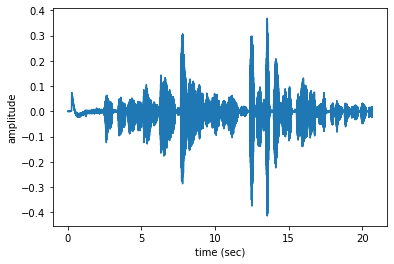

In [30]:
n=0
fs = None # Sampling frequency. If None, fs would be 22050
x, fs = librosa.load(files[n],sr=fs)
t = np.arange(len(x))/fs
plt.plot(t,x)
plt.xlabel('time (sec)')
plt.ylabel('amplitude')
plt.show()
display(ipd.Audio(files[n]))

In [38]:
MLENDHW_df.loc[files[n].split('\\')[-1]]

participant            S17
interpretation         hum
number                   4
song              StarWars
Name: S17_hum_4_StarWars.wav, dtype: object

In [41]:
def getXy(files,labels_file, scale_audio=False, onlySingleDigit=False):
  X,y =[],[]
  for file in tqdm(files):
    fileID = file.split('\\')[-1]
    file_name = file.split('\\')[-1]
    #print(file_name)
    #print(labels_file.loc[fileID]['interpretation'])
    #print(labels_file.loc[fileID]['interpretation']=='hum')
    #yi = list(labels_file.loc[fileID]['interpretation'])[0]=='hum'
    yi = labels_file.loc[fileID]['song']=='Potter' 

    fs = None # if None, fs would be 22050
    x, fs = librosa.load(file,sr=fs)
    if scale_audio: x = x/np.max(np.abs(x))
    f0, voiced_flag = getPitch(x,fs,winLen=0.02)
      
    power = np.sum(x**2)/len(x)
    pitch_mean = np.nanmean(f0) if np.mean(np.isnan(f0))<1 else 0
    pitch_std  = np.nanstd(f0) if np.mean(np.isnan(f0))<1 else 0
    voiced_fr = np.mean(voiced_flag)

    xi = [power,pitch_mean,pitch_std,voiced_fr]
    X.append(xi)
    y.append(yi)

  return np.array(X),np.array(y)

In [50]:
# X,y = getXy(files, labels_file=MLENDHW_df, scale_audio=True, onlySingleDigit=True)

In [32]:
for _ in range(5):
  n = np.random.randint(98)
  display(ipd.Audio(files[n]))

In [33]:
def getPitch(x,fs,winLen=0.02):
  #winLen = 0.02 
  p = winLen*fs
  frame_length = int(2**int(p-1).bit_length())
  hop_length = frame_length//2
  f0, voiced_flag, voiced_probs = librosa.pyin(y=x, fmin=80, fmax=450, sr=fs,
                                                 frame_length=frame_length,hop_length=hop_length)
  return f0,voiced_flag